# Image Stitching Pipeline (Panorama)
Pipeline ghép ảnh toàn cảnh sử dụng SIFT, Homography (RANSAC) và Blending.

In [26]:
# from google.colab import files
# uploaded = files.upload()

## Import thư viện

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

In [28]:
# --- Tuning parameters (adjust to trade speed vs quality) ---
MAX_FEATURES   = 500   # max SIFT keypoints per image (lower = faster)
MATCH_RATIO    = 0.75    # Lowe's ratio threshold
MAX_GOOD_MATCH = 200     # cap good matches fed to RANSAC
RESIZE_WIDTH   = 600   # resize input images to this width for feature detection
RANSAC_THRESH  = 5.0     # RANSAC reprojection error (px)

# Single shared instances
SIFT = cv2.SIFT_create(nfeatures=MAX_FEATURES)

FLANN_INDEX_KDTREE = 1
FLANN = cv2.FlannBasedMatcher(
    {"algorithm": FLANN_INDEX_KDTREE, "trees": 5},
    {"checks": 50}
)

print(f"SIFT max features : {MAX_FEATURES}")
print(f"Resize width      : {RESIZE_WIDTH}px")
print(f"Max good matches  : {MAX_GOOD_MATCH}")

SIFT max features : 500
Resize width      : 600px
Max good matches  : 200


## Bước 1: Load và tiền xử lý ảnh

20240409_095557.jpg -> 2000x1500
20240409_095602.jpg -> 2000x1500
20240409_095607.jpg -> 2000x1500
20240409_095613.jpg -> 2000x1500


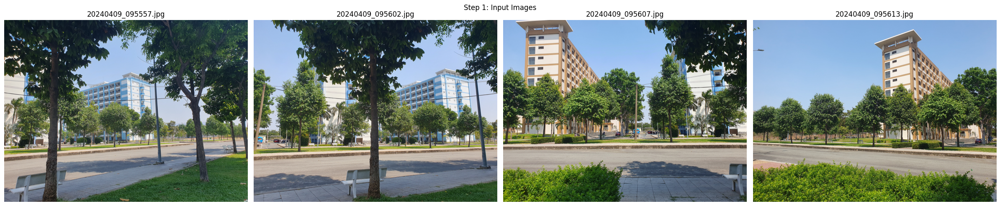

In [29]:
def load_and_preprocess(image_path, use_hist_eq=False, max_width=2000):
    """Load image, resize to max_width to prevent OOM, convert to grayscale, apply Gaussian Blur.
    Returns: color image (BGR), preprocessed grayscale image.
    """
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Image not found: {image_path}")
    # Resize full-color image if too large (prevents OOM in warp step)
    h, w = img.shape[:2]
    if w > max_width:
        scale = max_width / w
        img = cv2.resize(img, (max_width, int(h * scale)))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    if use_hist_eq:
        gray = cv2.equalizeHist(gray)
    return img, gray


def resize_for_detection(img, target_width=RESIZE_WIDTH):
    """Resize image for faster feature detection. Returns resized image and scale factor."""
    h, w = img.shape[:2]
    if w <= target_width:
        return img, 1.0
    scale = target_width / w
    resized = cv2.resize(img, (target_width, int(h * scale)))
    return resized, scale


# --- Set input image paths ---
image_paths = [
    '/content/20240409_095557.jpg',
    '/content/20240409_095602.jpg',
    '/content/20240409_095607.jpg',
    '/content/20240409_095613.jpg'
]

images_color, images_gray = [], []
for path in image_paths:
    color, gray = load_and_preprocess(path, max_width=2000)
    images_color.append(color)
    images_gray.append(gray)
    print(f"{os.path.basename(path)} -> {color.shape[1]}x{color.shape[0]}")

fig, axes = plt.subplots(1, len(images_color), figsize=(6 * len(images_color), 5))
if len(images_color) == 1:
    axes = [axes]
for ax, img, path in zip(axes, images_color, image_paths):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(os.path.basename(path))
    ax.axis('off')
plt.suptitle('Step 1: Input Images')
plt.tight_layout()
plt.show()

## Bước 2: Trích xuất đặc trưng bằng SIFT

Keypoints detected: 500
Keypoints detected: 500
Keypoints detected: 500
Keypoints detected: 500


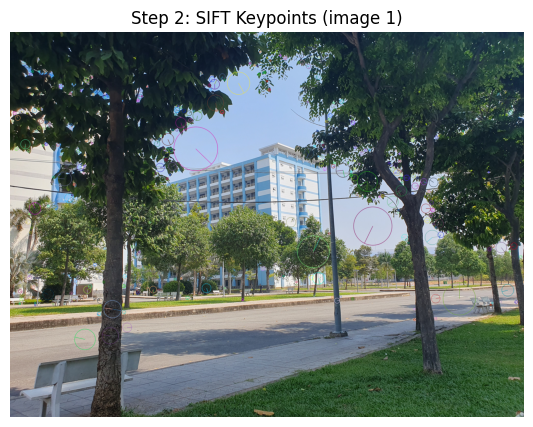

In [30]:
def extract_features(gray_img):
    """Resize to RESIZE_WIDTH, detect SIFT keypoints, scale coords back to original size."""
    small, scale = resize_for_detection(gray_img)
    kp, des = SIFT.detectAndCompute(small, None)
    # Scale keypoint coordinates back to original image space
    if scale < 1.0:
        for k in kp:
            k.pt   = (k.pt[0] / scale, k.pt[1] / scale)
            k.size /= scale
    return kp, des


keypoints_list, descriptors_list = [], []
for gray in images_gray:
    kp, des = extract_features(gray)
    keypoints_list.append(kp)
    descriptors_list.append(des)
    print(f"Keypoints detected: {len(kp)}")

img_kp = cv2.drawKeypoints(
    images_color[0], keypoints_list[0], None,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)
plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
plt.title('Step 2: SIFT Keypoints (image 1)')
plt.axis('off')
plt.show()

## Bước 3: So khớp đặc trưng (Feature Matching)

Good matches (capped at 200): 122


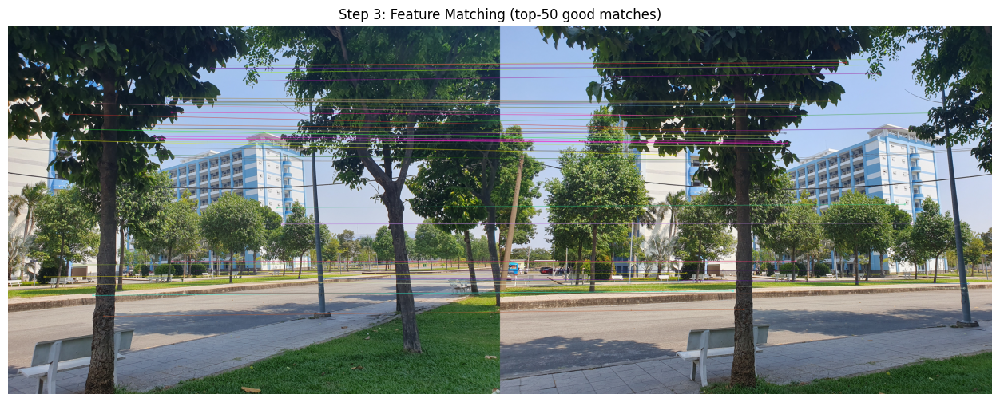

In [31]:
def match_features(des1, des2, ratio_thresh=MATCH_RATIO, max_matches=MAX_GOOD_MATCH):
    """Match descriptors using FLANN + Lowe's Ratio Test. Cap result at max_matches."""
    des1 = des1.astype(np.float32)
    des2 = des2.astype(np.float32)
    raw  = FLANN.knnMatch(des1, des2, k=2)
    good = [m for m, n in raw if m.distance < ratio_thresh * n.distance]
    # Sort by distance, keep only top max_matches
    good = sorted(good, key=lambda m: m.distance)[:max_matches]
    return good


good_matches = match_features(descriptors_list[0], descriptors_list[1])
print(f"Good matches (capped at {MAX_GOOD_MATCH}): {len(good_matches)}")

img_matches = cv2.drawMatches(
    images_color[0], keypoints_list[0],
    images_color[1], keypoints_list[1],
    good_matches[:50], None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)
plt.figure(figsize=(16, 6))
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title('Step 3: Feature Matching (top-50 good matches)')
plt.axis('off')
plt.show()

## Bước 4: Ước lượng Homography bằng RANSAC

In [32]:
def estimate_homography(kp1, kp2, good_matches, min_match=10):
    """Estimate homography matrix using RANSAC."""
    if len(good_matches) < min_match:
        print(f"Not enough matches: {len(good_matches)} < {min_match}")
        return None
    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, RANSAC_THRESH)
    print(f"Inliers: {int(mask.sum())}/{len(good_matches)}")
    return H


H = estimate_homography(keypoints_list[0], keypoints_list[1], good_matches)
print("Homography matrix H:")
print(H)

Inliers: 66/122
Homography matrix H:
[[ 5.88284017e-01 -2.67885396e-03  6.57657380e+02]
 [-1.70615053e-01  8.40695678e-01  1.39316299e+02]
 [-1.88487979e-04 -9.52591880e-06  1.00000000e+00]]


## Bước 5: Căn chỉnh ảnh (Image Warping)

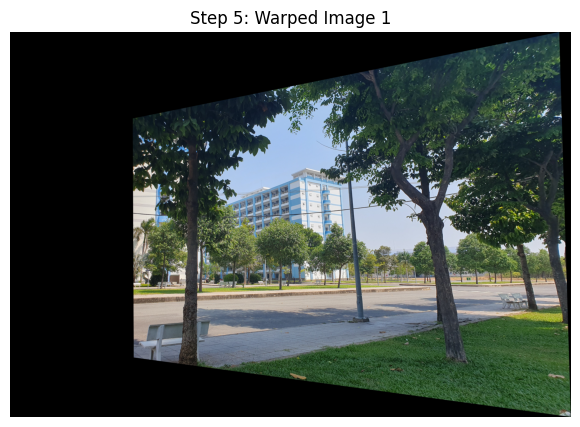

In [33]:
def warp_images(img1, img2, H):
    """Warp img1 into img2's coordinate space using perspective transform.
    Returns: warped image, translation matrix, canvas size, offset (ox, oy).
    """
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    corners1   = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    corners1_t = cv2.perspectiveTransform(corners1, H)
    corners2   = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)

    all_c = np.concatenate([corners2, corners1_t])
    [x_min, y_min] = np.int32(all_c.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_c.max(axis=0).ravel() + 0.5)

    translation = np.array([[1,0,-x_min],[0,1,-y_min],[0,0,1]], dtype=np.float64)
    canvas_w, canvas_h = x_max - x_min, y_max - y_min
    img1_warped = cv2.warpPerspective(img1, translation @ H, (canvas_w, canvas_h))

    return img1_warped, translation, (canvas_w, canvas_h), (-x_min, -y_min)


img1_warped, translation, canvas_size, (ox, oy) = warp_images(
    images_color[0], images_color[1], H
)

plt.figure(figsize=(12, 5))
plt.imshow(cv2.cvtColor(img1_warped, cv2.COLOR_BGR2RGB))
plt.title('Step 5: Warped Image 1')
plt.axis('off')
plt.show()

## Bước 6: Tạo canvas và ghép ảnh

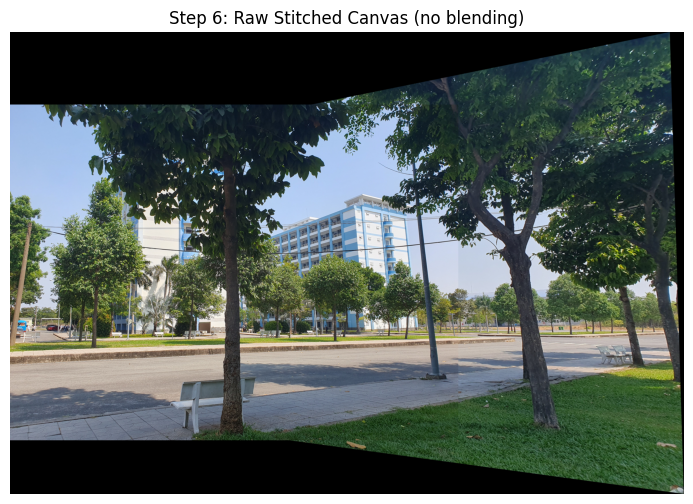

In [34]:
def stitch_two_images_raw(img1, img2, H):
    """Warp img1 and place img2 onto the canvas without blending."""
    img1_warped, _, _, (ox, oy) = warp_images(img1, img2, H)
    canvas = img1_warped.copy()
    h2, w2 = img2.shape[:2]
    canvas[oy:oy+h2, ox:ox+w2] = img2
    return canvas, img1_warped, (ox, oy)


canvas_raw, img1_warped, (ox, oy) = stitch_two_images_raw(
    images_color[0], images_color[1], H
)

plt.figure(figsize=(14, 6))
plt.imshow(cv2.cvtColor(canvas_raw, cv2.COLOR_BGR2RGB))
plt.title('Step 6: Raw Stitched Canvas (no blending)')
plt.axis('off')
plt.show()

## Bước 7: Xử lý vùng chồng lấn (Blending)
### 7a. Average Blending (cơ bản)

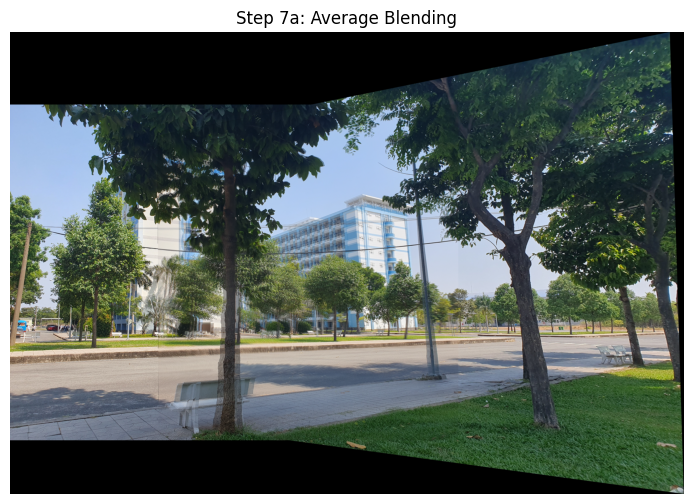

In [35]:
def average_blending(img1_warped, img2, ox, oy):
    """Blend overlap region by averaging pixel values."""
    canvas = img1_warped.copy()
    h2, w2 = img2.shape[:2]
    roi    = img1_warped[oy:oy+h2, ox:ox+w2]

    mask1   = (roi.sum(axis=2) > 0).astype(np.float32)
    mask2   = (img2.sum(axis=2) > 0).astype(np.float32)
    overlap = (mask1 * mask2)[..., np.newaxis]

    blended = np.where(
        overlap > 0,
        ((roi.astype(np.float32) + img2.astype(np.float32)) / 2).astype(np.uint8),
        np.where(mask2[..., np.newaxis] > 0, img2, roi)
    )
    canvas[oy:oy+h2, ox:ox+w2] = blended
    return canvas


result_avg = average_blending(img1_warped, images_color[1], ox, oy)

plt.figure(figsize=(14, 6))
plt.imshow(cv2.cvtColor(result_avg, cv2.COLOR_BGR2RGB))
plt.title('Step 7a: Average Blending')
plt.axis('off')
plt.show()

### 7b. Feather Blending (cải tiến)

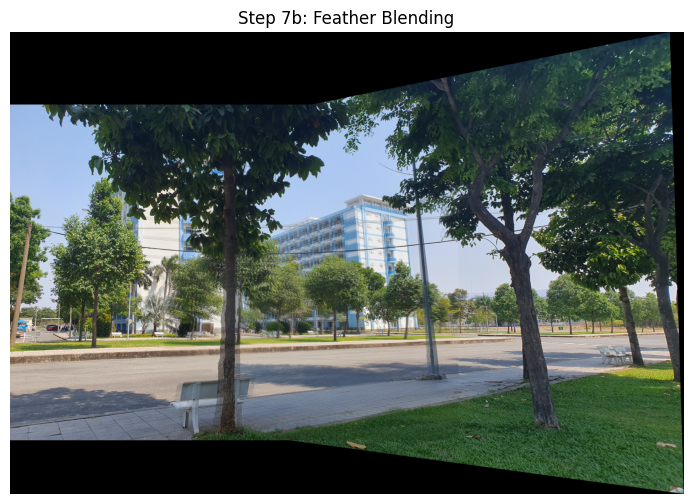

In [36]:
def feather_blending(img1_warped, img2, ox, oy):
    """Blend using distance-transform weight maps for smooth transitions."""
    canvas = img1_warped.copy().astype(np.float32)
    h2, w2 = img2.shape[:2]
    roi    = img1_warped[oy:oy+h2, ox:ox+w2].astype(np.float32)
    img2_f = img2.astype(np.float32)

    mask1 = (roi.sum(axis=2) > 0).astype(np.uint8)
    mask2 = (img2_f.sum(axis=2) > 0).astype(np.uint8)

    dist1 = cv2.distanceTransform(mask1, cv2.DIST_L2, 5).astype(np.float32)
    dist2 = cv2.distanceTransform(mask2, cv2.DIST_L2, 5).astype(np.float32)
    total = dist1 + dist2 + 1e-6

    canvas[oy:oy+h2, ox:ox+w2] = (dist1/total)[..., np.newaxis] * roi \
                                + (dist2/total)[..., np.newaxis] * img2_f
    return canvas.astype(np.uint8)


result_feather = feather_blending(img1_warped, images_color[1], ox, oy)

plt.figure(figsize=(14, 6))
plt.imshow(cv2.cvtColor(result_feather, cv2.COLOR_BGR2RGB))
plt.title('Step 7b: Feather Blending')
plt.axis('off')
plt.show()

## Bước 8: Ghép nhiều ảnh (Multi-image Stitching)

Reference: image[2], total 4 images

Cylindrical projection...
  image[0]: f=1732.1px
  image[1]: f=1732.1px
  image[2]: f=1732.1px
  image[3]: f=1732.1px

Pairwise homographies (original adjacent images):
  H(1 -> 0):   Good matches: 135, Inliers: 55
  H(2 -> 1):   Good matches: 83, Inliers: 44
  H(3 -> 2):   Good matches: 117, Inliers: 46

Valid images: [0, 1, 2, 3]
Canvas: 5635 x 2561 px
  Blending image 2...
  Blending image 3...
  Blending image 1...
  Blending image 0...


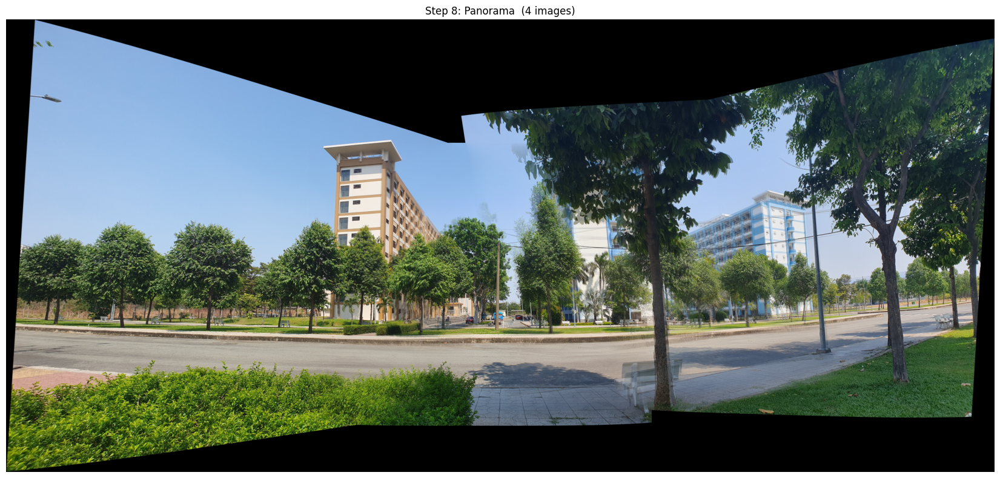

Saved: panorama_result.jpg


In [38]:

def crop_black_border(img):
    """Crop black borders from canvas."""
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
    x, y, w, h = cv2.boundingRect(thresh)
    return img[y:y+h, x:x+w]


# ── Cylindrical projection ────────────────────────────────────────────────────
def cylindrical_project(img, f):
    """Project img onto a cylinder of focal length f.
    Removes the perspective distortion caused by panning with a camera.
    """
    h, w = img.shape[:2]
    # Build meshgrid of destination pixel coords
    x_c = np.arange(w, dtype=np.float32) - w / 2
    y_c = np.arange(h, dtype=np.float32) - h / 2
    X, Y = np.meshgrid(x_c, y_c)
    # Map back to sphere then to cylinder
    theta = X / f                    # angle around cylinder
    h_cyl = Y / np.sqrt(X**2 + f**2)
    map_x = (f * np.tan(theta) + w / 2).astype(np.float32)
    map_y = (h_cyl * f / np.cos(theta) + h / 2).astype(np.float32)
    return cv2.remap(img, map_x, map_y, cv2.INTER_LINEAR,
                     borderMode=cv2.BORDER_CONSTANT, borderValue=0)


def estimate_focal_length(img):
    """Rough estimate: assume 60 degree horizontal FOV."""
    h, w = img.shape[:2]
    fov_deg = 60.0
    f = (w / 2) / np.tan(np.radians(fov_deg / 2))
    return f


# ── Feature helpers ───────────────────────────────────────────────────────────
def get_features_fast(color_img):
    """Extract SIFT on resized image, scale coords back."""
    gray  = cv2.GaussianBlur(cv2.cvtColor(color_img, cv2.COLOR_BGR2GRAY), (5, 5), 0)
    small, scale = resize_for_detection(gray)
    kp, des = SIFT.detectAndCompute(small, None)
    if scale < 1.0:
        for k in kp:
            k.pt   = (k.pt[0] / scale, k.pt[1] / scale)
            k.size /= scale
    return kp, des


def compute_translation(img_src, img_dst):
    """On cylindrical images, only estimate X/Y translation (not full homography).
    Returns (dx, dy) shift of img_src relative to img_dst, or None.
    """
    kp1, des1 = get_features_fast(img_src)
    kp2, des2 = get_features_fast(img_dst)
    good = match_features(des1.astype(np.float32), des2.astype(np.float32))
    print(f"  Good matches: {len(good)}", end="")
    if len(good) < 10:
        print(" -> SKIP")
        return None
    pts1 = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    # Use full homography but then extract translation component only
    H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, RANSAC_THRESH)
    if H is None:
        print(" -> RANSAC failed")
        return None
    inliers = int(mask.sum())
    print(f", Inliers: {inliers}")
    # Translation from homography
    dx = H[0, 2]
    dy = H[1, 2]
    return dx, dy, H


# ── Center-out stitching on cylindrical images ───────────────────────────────
def feather_blend_onto(canvas, warped):
    """Feather-blend warped onto canvas. Both same size."""
    mask_c = (canvas.sum(axis=2) > 0).astype(np.uint8)
    mask_w = (warped.sum(axis=2) > 0).astype(np.uint8)
    only_c = (mask_c > 0) & (mask_w == 0)
    only_w = (mask_w > 0) & (mask_c == 0)
    both   = (mask_c > 0) & (mask_w > 0)

    dist_c = cv2.distanceTransform(mask_c, cv2.DIST_L2, 5).astype(np.float32)
    dist_w = cv2.distanceTransform(mask_w, cv2.DIST_L2, 5).astype(np.float32)
    total  = dist_c + dist_w + 1e-6

    result = np.zeros_like(canvas)
    result[only_c] = canvas[only_c]
    result[only_w] = warped[only_w]

    w_c = (dist_c / total)[..., np.newaxis]
    w_w = (dist_w / total)[..., np.newaxis]
    blended = (w_c * canvas.astype(np.float32) +
               w_w * warped.astype(np.float32)).astype(np.uint8)
    result[both] = blended[both]
    return result


def stitch_center_out(image_list, blend_mode='feather'):
    """
    1. Project all images onto cylinder.
    2. Match each adjacent pair of ORIGINAL cylindrical images -> get H.
    3. Chain H from center outward to get absolute offset of each image.
    4. Place all images on one large canvas at their offsets and blend.
    """
    n   = len(image_list)
    mid = n // 2
    print(f"Reference: image[{mid}], total {n} images\n")

    # Step 1: cylindrical projection
    print("Cylindrical projection...")
    cyl_imgs = []
    for i, img in enumerate(image_list):
        f = estimate_focal_length(img)
        cyl = cylindrical_project(img, f)
        cyl_imgs.append(cyl)
        print(f"  image[{i}]: f={f:.1f}px")

    # Step 2: pairwise H between adjacent cylindrical images
    # H_pair[i] = H(cyl[i] -> cyl[i-1]), i in [1..n-1]
    print("\nPairwise homographies (original adjacent images):")
    H_pair = {}
    for i in range(1, n):
        print(f"  H({i} -> {i-1}): ", end="")
        result = compute_translation(cyl_imgs[i], cyl_imgs[i-1])
        H_pair[i] = result  # (dx, dy, H) or None

    # Step 3: chain to get cumulative H for each image -> reference space
    # H_cum[i] maps cyl[i] -> cyl[mid] coordinate space
    H_cum = {mid: np.eye(3)}

    # Right side: cyl[mid+1], cyl[mid+2], ...
    for i in range(mid + 1, n):
        if H_pair.get(i) is None:
            print(f"  Warning: no H for image {i}, right chain stops")
            break
        _, _, H = H_pair[i]
        H_cum[i] = H_cum[i-1] @ H   # chain: i -> i-1 -> ... -> mid

    # Left side: cyl[mid-1], cyl[mid-2], ...
    for i in range(mid - 1, -1, -1):
        if H_pair.get(i+1) is None:
            print(f"  Warning: no H for image {i}, left chain stops")
            break
        _, _, H = H_pair[i+1]
        # H maps i+1 -> i, so inv(H) maps i -> i+1
        H_cum[i] = H_cum[i+1] @ np.linalg.inv(H)

    print(f"\nValid images: {sorted(H_cum.keys())}")

    # Step 4: compute canvas bounding box
    all_corners = []
    for idx in sorted(H_cum.keys()):
        h, w = cyl_imgs[idx].shape[:2]
        corners = np.float32([[0,0],[w,0],[w,h],[0,h]]).reshape(-1,1,2)
        proj = cv2.perspectiveTransform(corners, H_cum[idx])
        all_corners.append(proj)

    all_pts = np.concatenate(all_corners)
    x_min = int(np.floor(all_pts[:,:,0].min())) - 1
    y_min = int(np.floor(all_pts[:,:,1].min())) - 1
    x_max = int(np.ceil(all_pts[:,:,0].max()))  + 1
    y_max = int(np.ceil(all_pts[:,:,1].max()))  + 1
    cw, ch = x_max - x_min, y_max - y_min
    print(f"Canvas: {cw} x {ch} px")

    # Guard against degenerate canvas
    MAX_DIM = 12000
    if cw > MAX_DIM or ch > MAX_DIM:
        s = min(MAX_DIM / cw, MAX_DIM / ch)
        cw, ch = int(cw * s), int(ch * s)
        x_min, y_min = int(x_min * s), int(y_min * s)
        print(f"Scaled canvas to: {cw} x {ch} px")
    else:
        s = 1.0

    T = np.array([[s, 0, -x_min * s],
                  [0, s, -y_min * s],
                  [0, 0,  1        ]], dtype=np.float64)

    # Step 5: warp each cylindrical image directly onto canvas and blend
    canvas = np.zeros((ch, cw, 3), dtype=np.uint8)
    order  = [mid] + list(range(mid+1, n)) + list(range(mid-1, -1, -1))

    for idx in order:
        if idx not in H_cum:
            print(f"  Skipping image {idx}")
            continue
        H_final = T @ H_cum[idx]
        warped  = cv2.warpPerspective(cyl_imgs[idx], H_final, (cw, ch))
        print(f"  Blending image {idx}...")
        canvas  = feather_blend_onto(canvas, warped)

    return crop_black_border(canvas)


# ── Run ───────────────────────────────────────────────────────────────────────
if len(images_color) >= 2:
    panorama = stitch_center_out(images_color, blend_mode='feather')

    plt.figure(figsize=(20, 8))
    plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
    plt.title(f'Step 8: Panorama  ({len(images_color)} images)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    cv2.imwrite('panorama_result.jpg', panorama)
    print("Saved: panorama_result.jpg")
